# Landsat-8 on AWS

* **How can I efficiently find, visualize, and analyze a large set of Landsat-8 imagery on AWS?**

We will examine raster images from the [Landsat-8 instrument](https://www.usgs.gov/land-resources/nli/landsat). The Landsat program is the longest-running civilian satellite imagery program, with the first satellite launched in 1972 by the US Geological Survey. Landsat 8 is the latest satellite in this program, and was launched in 2013. Landsat observations are processed into “scenes”, each of which is approximately 183 km x 170 km, with a spatial resolution of 30 meters and a temporal resolution of 16 days. The duration of the landsat program makes it an attractive source of medium-scale imagery for land surface change analyses.

This notebook is a simplified update of a [blog post written in October 2018](https://medium.com/pangeo/cloud-native-geoprocessing-of-earth-observation-satellite-data-with-pangeo-997692d91ca2), highlighting the integration of several modern Python libraries: [satsearch](https://github.com/sat-utils/sat-search), [intake-stac](https://github.com/intake/intake-stac), [geopandas](https://github.com/geopandas/geopandas), [xarray](https://github.com/pydata/xarray),  [dask](https://github.com/dask/dask), [holoviz](https://holoviz.org)

## Finding data on the Cloud 

Finding geospatial data on the Cloud has been difficult until recent years. Earth scientists are accustomed to going to specific portals to find data, for example [NASA's Earthdata Search](https://search.earthdata.nasa.gov), ESA's Copernicus Hub (https://scihub.copernicus.eu), USGS National Map (https://www.usgs.gov/core-science-systems/national-geospatial-program/national-map). AWS has had a registry of open datasets stored on AWS for many years now https://aws.amazon.com/opendata/public-datasets/.  Earth-science specific data is also listed here - https://aws.amazon.com/earth/. But what if you want to search for Landsat8 data over an area of interest? Browsing through lists of files is cumbersome. 

An effort is underway to make geospatial data on the Cloud more easy to discover by having a bare-bones web-friendly and search-friendly metadata catalog standard: The SpatioTemporal Asset Catalog (STAC). Once the standard is set, many tools can co-exist to build upon it. For example https://www.element84.com/earth-search/ allows us to programmatically and visually search for data on AWS! Here we will use the [satsearch Python library](https://github.com/sat-utils/sat-search) for searching Landsat8 on AWS. Note you could also search for Sentinel2

In [1]:
# Suppress library deprecation warnings
import warnings

warnings.filterwarnings('ignore')

In [2]:
import satsearch

print(satsearch.__version__)
print(satsearch.config.API_URL)
from satsearch import Search

0.2.3
https://earth-search-legacy.aws.element84.com


In [3]:
# NOTE this STAC API endpoint does not currently search the entire catalog

bbox = (-124.71, 45.47, -116.78, 48.93)  # (west, south, east, north)

timeRange = '2019-01-01/2020-10-01'

# STAC metadata properties
properties = ['eo:row=027', 'eo:column=047', 'landsat:tier=T1']

results = Search.search(
    collection='landsat-8-l1',
    bbox=bbox,
    datetime=timeRange,
    property=properties,
    sort=['<datetime'],
)

print('%s items' % results.found())
items = results.items()
items.save('subset.geojson')

19 items


In [4]:
# Remember that it is easy to load geojson with geopandas!
import geopandas as gpd

gf = gpd.read_file('subset.geojson')
gf.head()

,id,collection,eo:gsd,eo:platform,eo:instrument,eo:off_nadir,eo:bands,datetime,eo:sun_azimuth,eo:sun_elevation,eo:cloud_cover,eo:row,eo:column,landsat:product_id,landsat:scene_id,landsat:processing_level,landsat:tier,landsat:revision,eo:epsg,geometry
0,LC80470272019096,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-06T19:01:20,152.713795,46.106183,79,027,047,LC08_L1TP_047027_20190406_20190422_01_T1,LC80470272019096LGN00,L1TP,T1,00,32610,"POLYGON ((-124.30921 48.51312, -121.80425 48.0..."
1,LC80470272019128,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-05-08T19:01:19,149.213545,56.592420,19,027,047,LC08_L1TP_047027_20190508_20190521_01_T1,LC80470272019128LGN00,L1TP,T1,00,32610,"POLYGON ((-124.27756 48.51300, -121.77234 48.0..."
2,LC80470272019160,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-06-09T19:01:37,143.652070,61.668260,63,027,047,LC08_L1TP_047027_20190609_20190619_01_T1,LC80470272019160LGN00,L1TP,T1,00,32610,"POLYGON ((-124.28944 48.51325, -121.78398 48.0..."
3,LC80470272019176,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-06-25T19:01:42,141.834366,61.713605,52,027,047,LC08_L1TP_047027_20190625_20190705_01_T1,LC80470272019176LGN00,L1TP,T1,00,32610,"POLYGON ((-124.28314 48.51335, -121.77799 48.0..."
4,LC80470272019208,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-07-27T19:01:51,143.987513,57.532989,76,027,047,LC08_L1TP_047027_20190727_20190801_01_T1,LC80470272019208LGN00,L1TP,T1,00,32610,"POLYGON ((-124.26661 48.51255, -121.76179 48.0..."


In [5]:
# Tidy display of band information from the 'eo:bands column'
import ast

import pandas as pd

band_info = pd.DataFrame(ast.literal_eval(gf.iloc[0]['eo:bands']))
band_info

,name,common_name,gsd,center_wavelength,full_width_half_max
0,B1,coastal,30,0.44,0.02
1,B2,blue,30,0.48,0.06
2,B3,green,30,0.56,0.06
3,B4,red,30,0.65,0.04
4,B5,nir,30,0.86,0.03
5,B6,swir16,30,1.60,0.08
6,B7,swir22,30,2.20,0.20
7,B8,pan,15,0.59,0.18
8,B9,cirrus,30,1.37,0.02
9,B10,lwir11,100,10.90,0.80


In [6]:
# Plot search AOI and frames on a map using Holoviz Libraries (more on these later)
import geoviews as gv
import hvplot.pandas

cols = gf.loc[:, ('id', 'eo:row', 'eo:column', 'geometry')]

footprints = cols.hvplot(
    geo=True, line_color='k', hover_cols=['eo:row', 'eo:column'], alpha=0.1, title='Landsat 8 T1'
)
tiles = gv.tile_sources.CartoEco.options(width=700, height=500)
labels = gv.tile_sources.StamenLabels.options(level='annotation')
tiles * footprints * labels

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (eo:row,eo:column)
   .WMTS.II    :WMTS   [Longitude,Latitude]

## ipywidgets

[ipywidgets](https://ipywidgets.readthedocs.io/en/latest/) provide another convenient approach to custom visualizations within JupyterLab. The function below allows us to browse through all the image thumbnails for a group of images (more specifically a specific Landsat8 path and row). 

In [7]:
from IPython.display import Image, display
from ipywidgets import interact


def browse_images(items):
    n = len(items)

    def view_image(i=0):
        item = items[i]
        print(f"id={item.id}\tdate={item.datetime}\tcloud%={item['eo:cloud_cover']}")
        display(Image(item.asset('thumbnail')['href']))

    interact(view_image, i=(0, n - 1))

id=LC80470272019096	date=2019-04-06 19:01:20.935226+00:00	cloud%=79


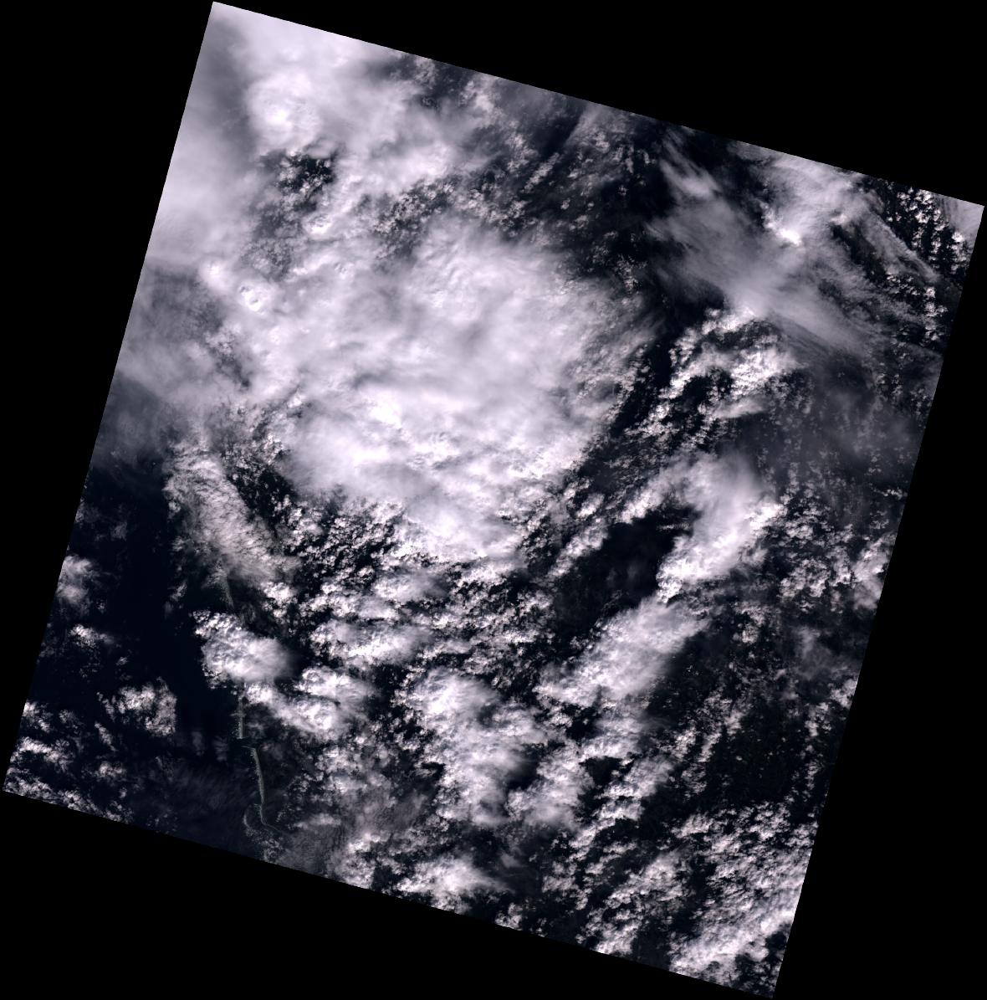

In [8]:
browse_images(items)

### Intake-STAC

the intake-stac library allows us to easily load these scenes described with STAC metadata into xarray DataArrays! NOTE this library is very new and will likely undergo changes in the near future. https://github.com/pangeo-data/intake-stac

In [9]:
# if you've installed intake-STAC, it will automatically import alongside intake
import intake

catalog = intake.open_stac_item_collection(items)

In [10]:
list(catalog)

['LC80470272019096',
 'LC80470272019128',
 'LC80470272019160',
 'LC80470272019176',
 'LC80470272019208',
 'LC80470272019224',
 'LC80470272019240',
 'LC80470272019272',
 'LC80470272019288',
 'LC80470272019304',
 'LC80470272019336',
 'LC80470272020003',
 'LC80470272020051',
 'LC80470272020083',
 'LC80470272020099',
 'LC80470272020131',
 'LC80470272020147',
 'LC80470272020163',
 'LC80470272020179']

In [11]:
sceneid = 'LC80470272019096'
catalog[sceneid]['B2'].metadata

{'type': 'image/x.geotiff',
 'eo:bands': [1],
 'title': 'Band 2 (blue)',
 'href': 'https://landsat-pds.s3.amazonaws.com/c1/L8/047/027/LC08_L1TP_047027_20190406_20190422_01_T1/LC08_L1TP_047027_20190406_20190422_01_T1_B2.TIF',
 'catalog_dir': ''}

In [12]:
# Let's work with the Geotiffs using Xarray
# NOTE that you don't have to specify the URL or filePath!

import xarray as xr

item = catalog[sceneid]
da = item['B2'].to_dask()
da.data

dask.array<open_rasterio-1ecc1a70573cd3dfa46fa2112336f2d0<this-array>, shape=(1, 7971, 7871), dtype=uint16, chunksize=(1, 7971, 7871), chunktype=numpy.ndarray>

## Dask Chunks and Cloud Optimized Geotiffs

Since we didn't specify chunk sizes, everything is read as one chunk. When we load larger sets of imagery
we can change these chunk sizes to use dask. It's best to align dask chunks with the way image chunks (typically called "tiles" are stored on disk or cloud storage buckets. The landsat data is stored on AWS S3 in a tiled Geotiff format where tiles are 512x512, so we should pick som multiple of that, and typically aim for chunksizes of ~100Mb (although this is subjective). You can read more about dask chunks here: https://docs.dask.org/en/latest/array-best-practices.html

Also check out this documentation about the Cloud-optimized Geotiff format, it is an excellent choice for putting satellite raster data on Cloud storage: https://www.cogeo.org/

In [13]:
# Intake-STAC Item to chunked dask array
da = item.B2(chunks=dict(band=1, x=2048, y=2048)).to_dask()
da.data

dask.array<open_rasterio-7f37879b20c3ab46a5255e3cc44bead9<this-array>, shape=(1, 7971, 7871), dtype=uint16, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>

In [14]:
# Let's load all the bands into an xarray dataset!
# Stick to bands that have the same Ground Sample Distance for simplicity
bands = band_info.query('gsd == 30').common_name.to_list()
bands

['coastal', 'blue', 'green', 'red', 'nir', 'swir16', 'swir22', 'cirrus']

In [15]:
stacked = item.stack_bands(bands)
da = stacked(chunks=dict(band=1, x=2048, y=2048)).to_dask()
da

<xarray.DataArray (band: 8, y: 7971, x: 7871)>
dask.array<concatenate, shape=(8, 7971, 7871), dtype=uint16, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
  * x        (x) float64 3.525e+05 3.525e+05 3.526e+05 ... 5.886e+05 5.886e+05
  * band     (band) <U2 'B1' 'B2' 'B3' 'B4' 'B5' 'B6' 'B7' 'B9'
Attributes:
    transform:      (30.0, 0.0, 352485.0, 0.0, -30.0, 5374215.0)
    crs:            +init=epsg:32610
    res:            (30.0, 30.0)
    is_tiled:       1
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Point

In [16]:
# If we want we can convert this to an xarray dataset, with variable names corresponding to common names
# This is all very fast because we are only reading metadata
da['band'] = bands
ds = da.to_dataset(dim='band')
print('Dataset size: [Gb]', ds.nbytes / 1e9)
ds

Dataset size: [Gb] 1.003962592


<xarray.Dataset>
Dimensions:  (x: 7871, y: 7971)
Coordinates:
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
  * x        (x) float64 3.525e+05 3.525e+05 3.526e+05 ... 5.886e+05 5.886e+05
Data variables:
    coastal  (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    blue     (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    green    (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    red      (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    nir      (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    swir16   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    swir22   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    cirrus   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
Attributes:
    transform:      (30.0, 0.0, 352485.0, 0.0, -30.0, 5374215.0)
    crs:            +init=epsg:32610
    res:            (30.0, 30.0)
    is_tiled:       1
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Point

In [17]:
# Computations or visualizations trigger the streaming of bytes from S3 into memory
# Here we will compute the mean for a number of pixels for a box defined by easting and northings
zonal_mean = ds['nir'].sel(x=slice(4.99e5, 5.03e5), y=slice(5.244e6, 5.238e6)).mean()
zonal_mean.compute()

<xarray.DataArray 'nir' ()>
array(12089.203419)

## Hvplot

HoloViz is a coordinated effort to make browser-based data visualization in Python easier to use, easier to learn, and more powerful! https://holoviz.org One particularly powerful library is `hvplot`, which allows for interactive visualizations of pandas dataframes or xarray DataArrays. With this tool you pull data on-the-fly only as required by zoom level and band selection.

In [18]:
import hvplot.xarray

da.hvplot.image(
    groupby='band',
    rasterize=True,
    dynamic=True,
    cmap='magma',
    width=700,
    height=500,
    widget_location='left',
)

Row
    [0] Column
        [0] VSpacer()
        [1] WidgetBox
            [0] Select(margin=(20, 20, 20, 20), name='band', options=['coastal', 'blue', ...], value='coastal', width=250)
        [2] VSpacer()
    [1] HoloViews(DynamicMap, widget_location='left')

## Dask-Gateway Cluster

If we don't specify a specific cluster, dask will use the cores on the machine we are running our notebook on instead, lets connect to a Dask-Gateway cluster. You can read more about this cluster at https://gateway.dask.org/. **It can take a few minutes for the cluster to become ready for computing. This is because EC2 machines are being created for you behind the scenes**. Monitor the 'Dashboard' link to see cluster activity.

In [19]:
from dask_gateway import GatewayCluster
from distributed import Client

cluster = GatewayCluster()
cluster.adapt(
    minimum=2, maximum=20
)  # Keep a minimum of 2 workers, but allow for scaling up to 20 if there is RAM and CPU pressure
client = Client(cluster)  # Make sure dask knows to use this cluster for computations
cluster

In [20]:
%%time

# First let's construct a large dataset with all the scenes in our search so that we
# have a time dimension
# Loop through geopandas geodataframe (each row is a STAC ITEM)
import dask


@dask.delayed
def stacitem_to_dataset(item):
    print(item.id)
    stacked = catalog[item.id].stack_bands(bands)
    da = stacked(chunks=dict(band=1, x=8000, y=2048)).to_dask()
    da['band'] = bands  # use common names
    da = da.expand_dims(time=[pd.to_datetime(item.datetime)])
    ds = da.to_dataset(dim='band')
    return ds


lazy_datasets = []
for i, item in gf.iterrows():
    ds = stacitem_to_dataset(item)
    lazy_datasets.append(ds)

datasets = dask.compute(*lazy_datasets)

CPU times: user 87.5 ms, sys: 28.7 ms, total: 116 ms
Wall time: 50.1 s


In [21]:
DS = xr.concat(datasets, dim='time')

In [22]:
print('Dataset size: [Gb]', DS.nbytes / 1e9)
DS

Dataset size: [Gb] 77.357853784


<xarray.Dataset>
Dimensions:  (time: 19, x: 7981, y: 7971)
Coordinates:
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
  * x        (x) float64 3.522e+05 3.522e+05 3.523e+05 ... 5.916e+05 5.916e+05
  * time     (time) datetime64[ns] 2019-04-06T19:01:20 ... 2020-06-27T19:01:35
Data variables:
    coastal  (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    blue     (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    green    (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    red      (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    nir      (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    swir16   (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    swir22   (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
    cirrus   (time, y, x) float64 dask.array<chunksize=(1, 2048, 7981), meta=np.ndarray>
Attributes:
    transform:      (30.0, 0.0, 352485.0, 0.0, -30.0, 5374215.0)
    crs:            +init=epsg:32610
    res:            (30.0, 30.0)
    is_tiled:       1
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Point

## Distributed computations

We'll calculate the classic NDVI index with all our data

NOTE that you should be using Landsat ARD data (https://www.usgs.gov/land-resources/nli/landsat/us-landsat-analysis-ready-data) for this with atmospheric corrections! 
this is just to illustrate the intuitive syntax of xarray


In [23]:
NDVI = (DS['nir'] - DS['red']) / (DS['nir'] + DS['red'])
NDVI

<xarray.DataArray (time: 19, y: 7971, x: 7981)>
dask.array<truediv, shape=(19, 7971, 7981), dtype=float64, chunksize=(1, 2048, 7981), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
  * x        (x) float64 3.522e+05 3.522e+05 3.523e+05 ... 5.916e+05 5.916e+05
  * time     (time) datetime64[ns] 2019-04-06T19:01:20 ... 2020-06-27T19:01:35

In [24]:
NDVI.data

dask.array<truediv, shape=(19, 7971, 7981), dtype=float64, chunksize=(1, 2048, 7981), chunktype=numpy.ndarray>

### A note on distributed versus local memory

In [25]:
# ndvi_my_memory = NDVI.compute() # compute pulls computation results into notebook process
NDVI = NDVI.persist()  # persist keeps computation results on the dask cluster

In [26]:
# Plotting pulls data from distributed cluster memory on-demand
NDVI.hvplot.image(
    groupby='time',
    x='x',
    y='y',
    cmap='BrBG',
    clim=(-1, 1),
    rasterize=True,
    dynamic=True,
    width=700,
    height=500,
)

:DynamicMap   [time]
   :Image   [x,y]   (value)

In [27]:
# Grab a subset and save as a netcdf file
sub = NDVI.sel(x=slice(4.5e5, 5.0e5), y=slice(5.25e6, 5.2e6)).mean(dim=['time'])
sub.hvplot.image(rasterize=True, dynamic=True, width=700, height=500, cmap='greens')

:DynamicMap   []
   :Image   [x,y]   (value)

In [28]:
myda = (
    sub.compute()
)  # pull subset to local memory first, some formats allow distributed writing too
myda.to_netcdf(path='myndvi.nc', engine='h5netcdf')

In [29]:
round_trip = xr.load_dataarray('myndvi.nc')

In [30]:
round_trip

<xarray.DataArray (y: 1667, x: 1667)>
array([[0.18563007, 0.19059552, 0.19488273, ..., 0.22227457, 0.22484207,
        0.22228028],
       [0.19064889, 0.19709001, 0.1931438 , ..., 0.2119117 , 0.21135045,
        0.2102868 ],
       [0.18888327, 0.18884146, 0.17802309, ..., 0.21959484, 0.22006417,
        0.21836583],
       ...,
       [0.07520521, 0.09875064, 0.11840775, ..., 0.19892638, 0.22551886,
        0.25085544],
       [0.06189936, 0.13935029, 0.14722115, ..., 0.23731821, 0.24823126,
        0.25648183],
       [0.08428243, 0.13998925, 0.18112026, ..., 0.25152911, 0.25269817,
        0.25897627]])
Coordinates:
  * x        (x) float64 4.5e+05 4.5e+05 4.501e+05 ... 4.999e+05 5e+05 5e+05
  * y        (y) float64 5.25e+06 5.25e+06 5.25e+06 ... 5.2e+06 5.2e+06 5.2e+06

In [31]:
# Be a good citizen and always explicitly shut down computing resources when you're not using them!
# client.close()
# cluster.close()